In [1]:
# Loading all the required dependencies
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
df = pd.read_csv(r'F:\Resume_projects\task\dataset\measures.csv')
df.head()

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,ambient,torque,profile_id
0,-0.450682,18.805172,19.086670,-0.350055,18.293219,0.002866,0.004419,0.000328,24.554214,18.316547,19.850691,0.187101,17
1,-0.325737,18.818571,19.092390,-0.305803,18.294807,0.000257,0.000606,-0.000785,24.538078,18.314955,19.850672,0.245417,17
2,-0.440864,18.828770,19.089380,-0.372503,18.294094,0.002355,0.001290,0.000386,24.544693,18.326307,19.850657,0.176615,17
3,-0.327026,18.835567,19.083031,-0.316199,18.292541,0.006105,0.000026,0.002046,24.554018,18.330833,19.850647,0.238303,17
4,-0.471150,18.857033,19.082525,-0.332272,18.291428,0.003133,-0.064317,0.037184,24.565397,18.326662,19.850639,0.208197,17


In [3]:
df.shape

(567, 13)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 567 entries, 0 to 566
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   u_q             567 non-null    float64
 1   coolant         567 non-null    float64
 2   stator_winding  567 non-null    float64
 3   u_d             567 non-null    float64
 4   stator_tooth    567 non-null    float64
 5   motor_speed     567 non-null    float64
 6   i_d             567 non-null    float64
 7   i_q             567 non-null    float64
 8   pm              567 non-null    float64
 9   stator_yoke     567 non-null    float64
 10  ambient         567 non-null    float64
 11  torque          567 non-null    float64
 12  profile_id      567 non-null    int64  
dtypes: float64(12), int64(1)
memory usage: 57.7 KB


In [5]:
# we can drop the profile id as its not required.
df.drop(columns=['profile_id'], axis=1, inplace=True)

In [6]:
df.shape

(567, 12)

In [7]:
df.columns

Index(['u_q', 'coolant', 'stator_winding', 'u_d', 'stator_tooth',
       'motor_speed', 'i_d', 'i_q', 'pm', 'stator_yoke', 'ambient', 'torque'],
      dtype='object')

# I have make decision that my target variable is stator_yoke     

<AxesSubplot:xlabel='u_q', ylabel='Count'>

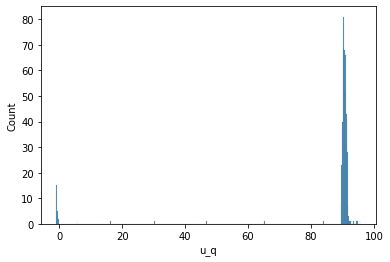

In [21]:
# Some EDA

sns.histplot(df['u_q'])

In [8]:
df['u_q'].describe()

count    567.000000
mean      86.112376
std       19.550879
min       -0.974433
25%       90.132755
50%       90.532616
75%       91.003258
max       95.686531
Name: u_q, dtype: float64

In [23]:
from pandas_profiling import ProfileReport

In [24]:
profile = ProfileReport(df, title="Pandas Profiling Report")

In [26]:
profile.to_widgets()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

  Using cached joblib-1.1.0-py2.py3-none-any.whl (306 kB)
  Using cached Jinja2-3.1.2-py3-none-any.whl (133 kB)
  Using cached seaborn-0.11.2-py3-none-any.whl (292 kB)
  Using cached jupyter_client-7.3.0-py3-none-any.whl (130 kB)
  Using cached jupyter_core-4.10.0-py3-none-any.whl (87 kB)
  Using cached attrs-21.4.0-py2.py3-none-any.whl (60 kB)
  Using cached ipython_genutils-0.2.0-py2.py3-none-any.whl (26 kB)
  Using cached ipykernel-6.13.0-py3-none-any.whl (131 kB)
  Using cached traitlets-5.1.1-py3-none-any.whl (102 kB)
  Using cached nbformat-5.4.0-py3-none-any.whl (73 kB)
  Using cached nest_asyncio-1.5.5-py3-none-any.whl (5.2 kB)
  Using cached packaging-21.3-py3-none-any.whl (40 kB)
  Using cached matplotlib_inline-0.1.3-py3-none-any.whl (8.2 kB)
  Using cached decorator-5.1.1-py3-none-any.whl (9.1 kB)
  Using cached jedi-0.18.1-py2.py3-none-any.whl (1.6 MB)
  Using cached backcall-0.2.0-py2.py3-none-any.whl (11 kB)
  Using cached prompt_toolkit-3.0.29-py3-none-any.whl (381 kB)


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [27]:
profile.to_notebook_iframe()


Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [28]:
profile.to_file("motor.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
# seperation 
x = df.drop(columns = ['stator_yoke'], axis=1)

In [10]:
x.head()

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,ambient,torque
0,-0.450682,18.805172,19.086670,-0.350055,18.293219,0.002866,0.004419,0.000328,24.554214,19.850691,0.187101
1,-0.325737,18.818571,19.092390,-0.305803,18.294807,0.000257,0.000606,-0.000785,24.538078,19.850672,0.245417
2,-0.440864,18.828770,19.089380,-0.372503,18.294094,0.002355,0.001290,0.000386,24.544693,19.850657,0.176615
3,-0.327026,18.835567,19.083031,-0.316199,18.292541,0.006105,0.000026,0.002046,24.554018,19.850647,0.238303
4,-0.471150,18.857033,19.082525,-0.332272,18.291428,0.003133,-0.064317,0.037184,24.565397,19.850639,0.208197


In [11]:
y = df['stator_yoke']

In [12]:
y

0      18.316547
1      18.314955
2      18.326307
3      18.330833
4      18.326662
         ...    
562    33.060062
563    33.088875
564    33.101326
565    33.109367
566    33.112366
Name: stator_yoke, Length: 567, dtype: float64

In [13]:
from sklearn.preprocessing import StandardScaler
scale = StandardScaler()
x_scale = scale.fit_transform(x)
x_scale

array([[-4.43148838, -1.59591441, -1.82561525, ..., -1.5855984 ,
        -0.64428024, -4.41420032],
       [-4.425092  , -1.5180987 , -1.82515309, ..., -1.58857514,
        -0.64431663, -4.40855576],
       [-4.43098578, -1.45887015, -1.82539627, ..., -1.58735489,
        -0.64434574, -4.41521522],
       ...,
       [ 0.20135656,  0.85126577,  1.32539789, ...,  1.60535223,
         0.33149295,  0.25431944],
       [ 0.20378283,  1.03928634,  1.32270172, ...,  1.61046547,
         0.11375474,  0.24984216],
       [ 0.19870767,  1.24800973,  1.32113081, ...,  1.61557096,
        -0.04226385,  0.24833237]])

In [14]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [15]:
x_transform = pd.DataFrame(x_scale, columns = x.columns)

In [16]:
vif = pd.DataFrame()
vif['values'] = [variance_inflation_factor(x_transform, i) for i in range(x_transform.shape[1])]
vif['columns'] = x.columns
print(vif)

          values         columns
0    1610.342759             u_q
1       2.638887         coolant
2     325.124511  stator_winding
3    4252.131675             u_d
4     392.385983    stator_tooth
5   23259.297357     motor_speed
6    4917.344050             i_d
7     573.574721             i_q
8      89.262909              pm
9       1.759115         ambient
10   1505.117185          torque


In [22]:
# let's build the model
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x_transform, y, test_size=0.2, random_state=32)

In [23]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(n_estimators=100,bootstrap=True, max_features='sqrt')


In [24]:
model.fit(x_train,y_train)

RandomForestRegressor(max_features='sqrt')

In [29]:
rf_prediction = model.predict(x_test)
rf_prediction.reshape(-1, 1)

array([[23.61688532],
       [30.6177141 ],
       [25.7907485 ],
       [18.31489406],
       [31.52231499],
       [28.47599771],
       [30.96537264],
       [20.01878399],
       [23.65006744],
       [18.31957594],
       [24.07739954],
       [18.56951479],
       [24.70466993],
       [25.69792923],
       [19.97440622],
       [18.31668964],
       [31.74010563],
       [19.82345438],
       [31.71991224],
       [28.69885183],
       [19.42213867],
       [21.84626423],
       [23.7779586 ],
       [21.91033325],
       [30.40566978],
       [28.02847113],
       [29.81752302],
       [19.85139893],
       [18.35219689],
       [31.56425011],
       [18.81393831],
       [27.58576088],
       [19.87717476],
       [18.5610445 ],
       [24.81811079],
       [26.48734764],
       [23.4067301 ],
       [32.75307182],
       [18.64023548],
       [31.31479786],
       [26.54488905],
       [28.28126331],
       [24.65990421],
       [19.08732332],
       [32.05044409],
       [28

In [26]:
rf_prediction

array([23.61688532, 30.6177141 , 25.7907485 , 18.31489406, 31.52231499,
       28.47599771, 30.96537264, 20.01878399, 23.65006744, 18.31957594,
       24.07739954, 18.56951479, 24.70466993, 25.69792923, 19.97440622,
       18.31668964, 31.74010563, 19.82345438, 31.71991224, 28.69885183,
       19.42213867, 21.84626423, 23.7779586 , 21.91033325, 30.40566978,
       28.02847113, 29.81752302, 19.85139893, 18.35219689, 31.56425011,
       18.81393831, 27.58576088, 19.87717476, 18.5610445 , 24.81811079,
       26.48734764, 23.4067301 , 32.75307182, 18.64023548, 31.31479786,
       26.54488905, 28.28126331, 24.65990421, 19.08732332, 32.05044409,
       28.80035366, 26.90959644, 19.50727585, 30.4317419 , 30.02199097,
       26.30994255, 32.43509693, 26.44356346, 30.71314045, 29.21539364,
       18.52582382, 27.63801958, 21.77286541, 26.80194141, 19.78394085,
       19.13644665, 31.77538475, 28.81064447, 18.6429591 , 29.32382967,
       29.46555391, 31.36808258, 25.01374291, 23.23207794, 18.61